# Projekt - Anna Stępka

## Temat 1
Przewidywanie ceny domów. Celem projektu jest zastosowanie modeli regresji do przewidzenia ceny
domu o podanych cechach.

Link do danych: web.stanford.edu/class/stats191/data/ames2000_NAfix.csv
Dokładny opis danych: http://web.stanford.edu/class/stats191/data/amesdoc.txt

Zmienna celu (cena domu): SalePrice

Wymogi:
<br> ● Musi zostać wykorzystany model regresji liniowej.
<br>● Muszą zostać wykorzystane przynajmniej dwie inne metody regresji: regresja Ridge, regresja
Lasso, drzewo regresyjne, las losowy regresyjny, XGBoost lub inne).
<br>● Trzeba uwzględnić optymalizację modeli/pipelinów.
<br>● Nie usuwamy żadnych obserwacji - braki danych uzupełniamy w jakiś sposób.
<br>● Wszelkie nieoczywiste przekształcenia danych należy opatrzyć uzasadnieniem dlaczego
dokonujemy tego przekształcenia (np. robimy wykres i uzasadniamy wzięcie logarytmu ze
zmiennej tym, że rozkład jest skośny).
<br>● Musi pojawić się ocena graficzna predykcji modeli (np. wykresy wartości przewidywanych od
prawdziwych czy wykresy reziduów).
<br>● Projekt musi być zakończony przejrzystym porównaniem przetestowanych rozwiązań
(modeli/pipelinów) w postaci tabeli , gdzie jeden wiersz opisuje jedno rozwiązanie i jego
wynik.

 


## 1. Pobranie danych i zapis do DataFrame
<br> Dane zostały pobrane 09.01.2021

In [2]:
# biblioteki
import numpy as np
import pandas as pd
import csv
import json
import matplotlib.pyplot as plt 
import seaborn as sns

In [3]:
df=pd.read_csv('web.stanford.edu/class/stats191/data/ames2000_NAfix.csv')
df.shape

(2000, 80)

In [4]:
df.head()

,MS.SubClass,MS.Zoning,Lot.Frontage,Lot.Area,Street,Alley,Lot.Shape,Land.Contour,Utilities,Lot.Config,...,Pool.Area,Pool.QC,Fence,Misc.Feature,Misc.Val,Mo.Sold,Yr.Sold,Sale.Type,Sale.Condition,SalePrice
0,120,RL,34,3901,Pave,None,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,8,2007,New,Partial,204000
1,20,RL,70,8400,Pave,None,Reg,Lvl,AllPub,Corner,...,0,None,MnPrv,None,0,4,2010,WD,Normal,126000
2,85,RL,60,7200,Pave,None,Reg,Lvl,AllPub,Inside,...,0,None,MnPrv,None,0,4,2009,WD,Normal,133900
3,90,RL,64,7018,Pave,None,Reg,Bnk,AllPub,Inside,...,0,None,None,None,0,6,2009,WD,Alloca,118858
4,60,RL,111,16259,Pave,None,Reg,Lvl,AllPub,Corner,...,0,None,None,None,0,9,2006,New,Partial,342643


In [5]:
df.columns

Index(['MS.SubClass', 'MS.Zoning', 'Lot.Frontage', 'Lot.Area', 'Street',
       'Alley', 'Lot.Shape', 'Land.Contour', 'Utilities', 'Lot.Config',
       'Land.Slope', 'Neighborhood', 'Condition.1', 'Condition.2', 'Bldg.Type',
       'House.Style', 'Overall.Qual', 'Overall.Cond', 'Year.Built',
       'Year.Remod.Add', 'Roof.Style', 'Roof.Matl', 'Exterior.1st',
       'Exterior.2nd', 'Mas.Vnr.Type', 'Mas.Vnr.Area', 'Exter.Qual',
       'Exter.Cond', 'Foundation', 'Bsmt.Qual', 'Bsmt.Cond', 'Bsmt.Exposure',
       'BsmtFin.Type.1', 'BsmtFin.SF.1', 'BsmtFin.Type.2', 'BsmtFin.SF.2',
       'Bsmt.Unf.SF', 'Total.Bsmt.SF', 'Heating', 'Heating.QC', 'Central.Air',
       'Electrical', 'X1st.Flr.SF', 'X2nd.Flr.SF', 'Low.Qual.Fin.SF',
       'Gr.Liv.Area', 'Bsmt.Full.Bath', 'Bsmt.Half.Bath', 'Full.Bath',
       'Half.Bath', 'Bedroom.AbvGr', 'Kitchen.AbvGr', 'Kitchen.Qual',
       'TotRms.AbvGrd', 'Functional', 'Fireplaces', 'Fireplace.Qu',
       'Garage.Type', 'Garage.Yr.Blt', 'Garage.Finish', 'Ga

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 80 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   MS.SubClass      2000 non-null   int64 
 1   MS.Zoning        2000 non-null   object
 2   Lot.Frontage     2000 non-null   object
 3   Lot.Area         2000 non-null   int64 
 4   Street           2000 non-null   object
 5   Alley            2000 non-null   object
 6   Lot.Shape        2000 non-null   object
 7   Land.Contour     2000 non-null   object
 8   Utilities        2000 non-null   object
 9   Lot.Config       2000 non-null   object
 10  Land.Slope       2000 non-null   object
 11  Neighborhood     2000 non-null   object
 12  Condition.1      2000 non-null   object
 13  Condition.2      2000 non-null   object
 14  Bldg.Type        2000 non-null   object
 15  House.Style      2000 non-null   object
 16  Overall.Qual     2000 non-null   int64 
 17  Overall.Cond     2000 non-null   

#### większość danych jest uzupełnionych więc nie usuwam żadnych kolumn. Każda kolumna może mieć potencjalny wpływ na cenę domu.

#### Usuwam kropki z nazw kolumn

In [7]:
df.rename(columns=lambda x: x.replace('.', '_'), inplace=True)
df.head()

,MS_SubClass,MS_Zoning,Lot_Frontage,Lot_Area,Street,Alley,Lot_Shape,Land_Contour,Utilities,Lot_Config,...,Pool_Area,Pool_QC,Fence,Misc_Feature,Misc_Val,Mo_Sold,Yr_Sold,Sale_Type,Sale_Condition,SalePrice
0,120,RL,34,3901,Pave,None,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,8,2007,New,Partial,204000
1,20,RL,70,8400,Pave,None,Reg,Lvl,AllPub,Corner,...,0,None,MnPrv,None,0,4,2010,WD,Normal,126000
2,85,RL,60,7200,Pave,None,Reg,Lvl,AllPub,Inside,...,0,None,MnPrv,None,0,4,2009,WD,Normal,133900
3,90,RL,64,7018,Pave,None,Reg,Bnk,AllPub,Inside,...,0,None,None,None,0,6,2009,WD,Alloca,118858
4,60,RL,111,16259,Pave,None,Reg,Lvl,AllPub,Corner,...,0,None,None,None,0,9,2006,New,Partial,342643



## 2. Przechodzę do analizy danych wejściowych

## Zmienna wynikowa - SalePrice

In [8]:
df.sort_values('SalePrice',ascending=False)

,MS_SubClass,MS_Zoning,Lot_Frontage,Lot_Area,Street,Alley,Lot_Shape,Land_Contour,Utilities,Lot_Config,...,Pool_Area,Pool_QC,Fence,Misc_Feature,Misc_Val,Mo_Sold,Yr_Sold,Sale_Type,Sale_Condition,SalePrice
580,60,RL,104,21535,Pave,None,IR1,Lvl,AllPub,Corner,...,0,None,None,None,0,1,2007,WD,Normal,755000
1541,60,RL,160,15623,Pave,None,IR1,Lvl,AllPub,Corner,...,555,Ex,MnPrv,None,0,7,2007,WD,Abnorml,745000
663,20,RL,105,13693,Pave,None,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,3,2009,WD,Normal,610000
211,60,RL,114,17242,Pave,None,IR1,Lvl,AllPub,Inside,...,0,None,None,None,0,5,2006,WD,Normal,584500
502,60,RL,107,13891,Pave,None,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,1,2009,New,Partial,582933
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1166,30,RM,50,5925,Pave,None,Reg,Lvl,AllPub,Corner,...,0,None,None,None,0,10,2009,WD,Normal,45000
680,20,C (all),50,9000,Pave,None,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,10,2006,WD,Abnorml,35311
960,30,RL,60,8088,Pave,Grvl,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,2,2006,ConLD,Normal,35000
1718,30,C (all),60,7879,Pave,None,Reg,Lvl,AllPub,Inside,...,0,None,GdWo,None,0,11,2009,WD,Abnorml,34900


<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

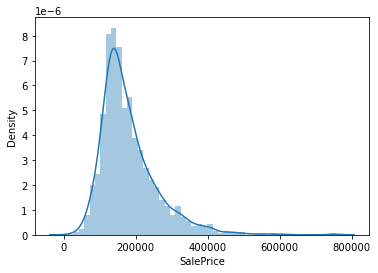

In [9]:
# funkcja częstości pozwala zobaczyć jakie są najczęściej występujące wartości oraz wartości odstające
sns.distplot(df['SalePrice'])

In [10]:
print("Skewness: %f" % df['SalePrice'].skew())
print("Kurtosis: %f" % df['SalePrice'].kurt())

Skewness: 1.738453
Kurtosis: 5.353734


In [11]:
# Skośność prawostronna
# Kurtoza dodatnia wskazuje że w danych istnieje więcej dodatnich wartości odstających

# W związku z powyższym aby uzyskać rozkład normalny muszę zastosować logarytmowanie.

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

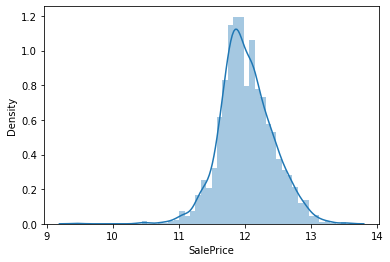

In [12]:
df['SalePrice'] = np.log(df['SalePrice'])
sns.distplot(df['SalePrice'])

In [13]:
# badam standardowe miary statystyczne
df['SalePrice'].describe()

count    2000.000000
mean       12.020398
std         0.400634
min         9.456341
25%        11.767568
50%        11.982929
75%        12.271357
max        13.534473
Name: SalePrice, dtype: float64

## Następnie należy przyjżeć się korelacji pomiędzy zmiennymi

<AxesSubplot:>

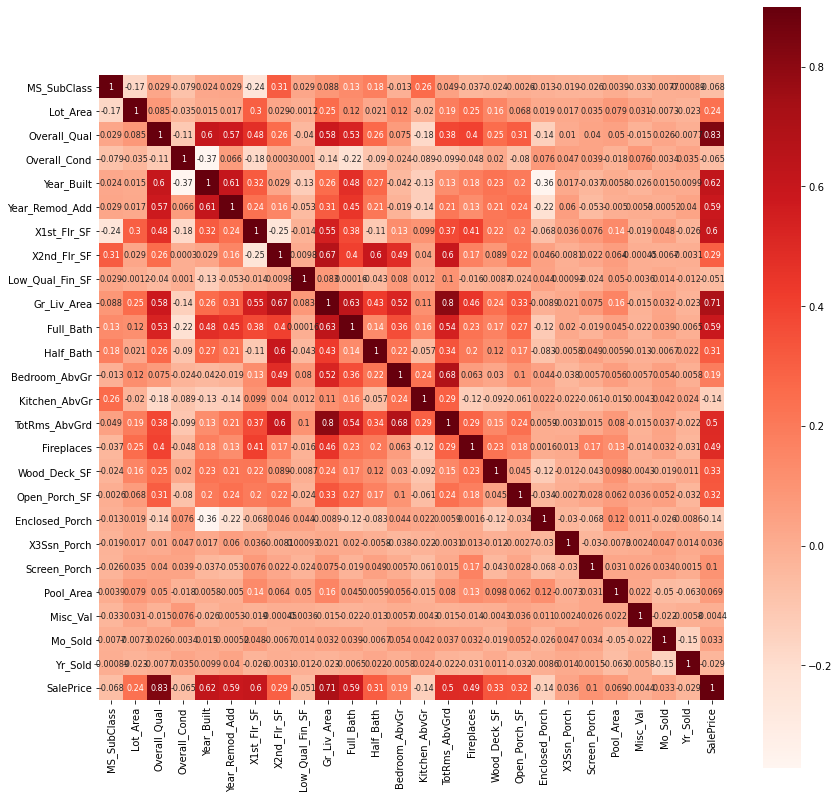

In [14]:
plt.subplots(figsize=(14,14))
sns.heatmap(df.corr(), vmax=0.9, cmap="Reds", annot=True, annot_kws={"size":8}, square=True)
#najwyższą korelację do ceny sprzedaży mają zmienne: 
# Overall_Quality (ogólna jakość), 
# Gr_Liv_Area (powierzchnia użytkowa), 
# Year_Built (rok budowy),
# X1st_Flr_SF (powierzchnia pierwszego piętra)
# Year Remod/Ad (rok przebudowy/remontu)

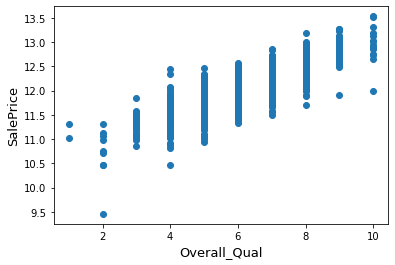

In [15]:
fig, ax = plt.subplots()
ax.scatter(x = df['Overall_Qual'], y = df['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('Overall_Qual', fontsize=13)
plt.show()

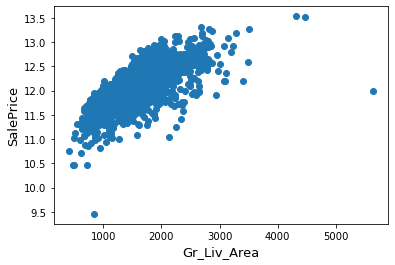

In [16]:
fig, ax = plt.subplots()
ax.scatter(x = df['Gr_Liv_Area'], y = df['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('Gr_Liv_Area', fontsize=13)
plt.show()

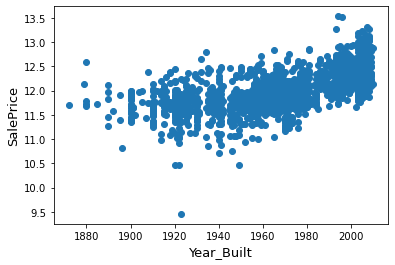

In [17]:
fig, ax = plt.subplots()
ax.scatter(x = df['Year_Built'], y = df['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('Year_Built', fontsize=13)
plt.show()

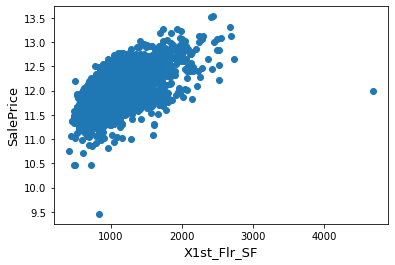

In [18]:
fig, ax = plt.subplots()
ax.scatter(x = df['X1st_Flr_SF'], y = df['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('X1st_Flr_SF', fontsize=13)
plt.show()

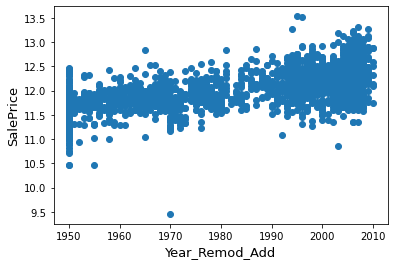

In [19]:
fig, ax = plt.subplots()
ax.scatter(x = df['Year_Remod_Add'], y = df['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('Year_Remod_Add', fontsize=13)
plt.show()

In [20]:
# Na wykredach widzimy wartości odstające które należy skorygować:
# jedna bardzo niska cena 
df[df['SalePrice']<10.5]

,MS_SubClass,MS_Zoning,Lot_Frontage,Lot_Area,Street,Alley,Lot_Shape,Land_Contour,Utilities,Lot_Config,...,Pool_Area,Pool_QC,Fence,Misc_Feature,Misc_Val,Mo_Sold,Yr_Sold,Sale_Type,Sale_Condition,SalePrice
680,20,C (all),50,9000,Pave,None,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,10,2006,WD,Abnorml,10.471950
960,30,RL,60,8088,Pave,Grvl,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,2,2006,ConLD,Normal,10.463103
1253,30,RM,68,9656,Pave,None,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,6,2010,WD,Abnorml,9.456341
1718,30,C (all),60,7879,Pave,None,Reg,Lvl,AllPub,Inside,...,0,None,GdWo,None,0,11,2009,WD,Abnorml,10.460242


In [21]:
df.loc[df['SalePrice'] <10.5, 'SalePrice'] = 10.5

In [22]:
#wyjątkowo wysoki metraż 1 piętra
df[df['X1st_Flr_SF']>3000]

,MS_SubClass,MS_Zoning,Lot_Frontage,Lot_Area,Street,Alley,Lot_Shape,Land_Contour,Utilities,Lot_Config,...,Pool_Area,Pool_QC,Fence,Misc_Feature,Misc_Val,Mo_Sold,Yr_Sold,Sale_Type,Sale_Condition,SalePrice
1233,60,RL,313,63887,Pave,None,IR3,Bnk,AllPub,Corner,...,480,Gd,None,None,0,1,2008,New,Partial,11.982929


In [23]:
df.loc[df['X1st_Flr_SF']>3000, 'X1st_Flr_SF'] = 3000

In [24]:
#wyjątkowo duża powierzchnia użytkowa
df[df['Gr_Liv_Area']>3500]

,MS_SubClass,MS_Zoning,Lot_Frontage,Lot_Area,Street,Alley,Lot_Shape,Land_Contour,Utilities,Lot_Config,...,Pool_Area,Pool_QC,Fence,Misc_Feature,Misc_Val,Mo_Sold,Yr_Sold,Sale_Type,Sale_Condition,SalePrice
580,60,RL,104,21535,Pave,None,IR1,Lvl,AllPub,Corner,...,0,None,None,None,0,1,2007,WD,Normal,13.534473
1233,60,RL,313,63887,Pave,None,IR3,Bnk,AllPub,Corner,...,480,Gd,None,None,0,1,2008,New,Partial,11.982929
1541,60,RL,160,15623,Pave,None,IR1,Lvl,AllPub,Corner,...,555,Ex,MnPrv,None,0,7,2007,WD,Abnorml,13.521139


In [25]:
df.loc[df['Gr_Liv_Area']>3500, 'Gr_Liv_Area'] =3500

In [26]:
# Uzupełniam braki w danych

In [27]:
column_names = df.columns.tolist()
total_rows = df.shape[0]
print(total_rows)

for column in column_names:
    num_missing = df[column].isnull().sum()
    percentage_missing = (num_missing/ total_rows) *100
    if num_missing>0:
        print(column, "", num_missing, percentage_missing)

# jest bardzo niewiele brakujących wartości, braki w żadnej kolumnie nie stanowią wiecej niż 1% danych danej kolumny.
# ponieważ braków jest bardzo mało można by je usunąć gdyby nie założenia projektu.


2000
Mas_Vnr_Type  16 0.8
Bsmt_Qual  1 0.05
Bsmt_Cond  1 0.05
Bsmt_Exposure  3 0.15
BsmtFin_Type_1  1 0.05
BsmtFin_Type_2  2 0.1
Garage_Finish  2 0.1
Garage_Qual  1 0.05
Garage_Cond  1 0.05


In [28]:
for column in column_names:
    num_missing = df[column].isnull().sum()
    if num_missing>0:
        print(df[column].value_counts())

None       1216
BrkFace     593
Stone       159
BrkCmn       15
CBlock        1
Name: Mas_Vnr_Type, dtype: int64
TA      892
Gd      837
Ex      163
Fa       54
None     52
Po        1
Name: Bsmt_Qual, dtype: int64
TA      1783
Gd        88
Fa        71
None      52
Ex         3
Po         2
Name: Bsmt_Cond, dtype: int64
No      1306
Av       285
Gd       188
Mn       166
None      52
Name: Bsmt_Exposure, dtype: int64
GLQ     584
Unf     565
ALQ     293
Rec     204
BLQ     195
LwQ     106
None     52
Name: BsmtFin_Type_1, dtype: int64
Unf     1694
Rec       70
LwQ       67
None      52
BLQ       50
ALQ       38
GLQ       27
Name: BsmtFin_Type_2, dtype: int64
Unf     831
RFn     578
Fin     479
None    110
Name: Garage_Finish, dtype: int64
TA      1785
None     111
Fa        84
Gd        16
Po         2
Ex         1
Name: Garage_Qual, dtype: int64
TA      1816
None     111
Fa        53
Gd         9
Po         8
Ex         2
Name: Garage_Cond, dtype: int64


In [29]:
#uzupełniam braki wartością "None"
df['Mas_Vnr_Type'] = df['Mas_Vnr_Type'].fillna('None')
df['Bsmt_Qual'] = df['Bsmt_Qual'].fillna('None')
df['Bsmt_Cond'] = df['Bsmt_Cond'].fillna('None')
df['Bsmt_Exposure'] = df['Bsmt_Exposure'].fillna('None')
df['BsmtFin_Type_1'] = df['BsmtFin_Type_1'].fillna('None')
df['BsmtFin_Type_2'] = df['BsmtFin_Type_2'].fillna('None')
df['Garage_Finish'] = df['Garage_Finish'].fillna('None')
df['Garage_Qual'] = df['Garage_Qual'].fillna('None')
df['Garage_Cond'] = df['Garage_Cond'].fillna('None')


In [30]:
column_names = df.columns.tolist()
total_rows = df.shape[0]

for column in column_names:
    num_missing = df[column].isnull().sum()
    percentage_missing = (num_missing/ total_rows) *100
    if num_missing>0:
        print(column, "", num_missing, percentage_missing)

In [31]:
# obróbka danych kategorycznych  

Index(['MS_Zoning', 'Lot_Frontage', 'Street', 'Alley', 'Lot_Shape',
       'Land_Contour', 'Utilities', 'Lot_Config', 'Land_Slope', 'Neighborhood',
       'Condition_1', 'Condition_2', 'Bldg_Type', 'House_Style', 'Roof_Style',
       'Roof_Matl', 'Exterior_1st', 'Exterior_2nd', 'Mas_Vnr_Type',
       'Mas_Vnr_Area', 'Exter_Qual', 'Exter_Cond', 'Foundation', 'Bsmt_Qual',
       'Bsmt_Cond', 'Bsmt_Exposure', 'BsmtFin_Type_1', 'BsmtFin_SF_1',
       'BsmtFin_Type_2', 'BsmtFin_SF_2', 'Bsmt_Unf_SF', 'Total_Bsmt_SF',
       'Heating', 'Heating_QC', 'Central_Air', 'Electrical', 'Bsmt_Full_Bath',
       'Bsmt_Half_Bath', 'Kitchen_Qual', 'Functional', 'Fireplace_Qu',
       'Garage_Type', 'Garage_Yr_Blt', 'Garage_Finish', 'Garage_Cars',
       'Garage_Area', 'Garage_Qual', 'Garage_Cond', 'Paved_Drive', 'Pool_QC',
       'Fence', 'Misc_Feature', 'Sale_Type', 'Sale_Condition'],
      dtype='object')


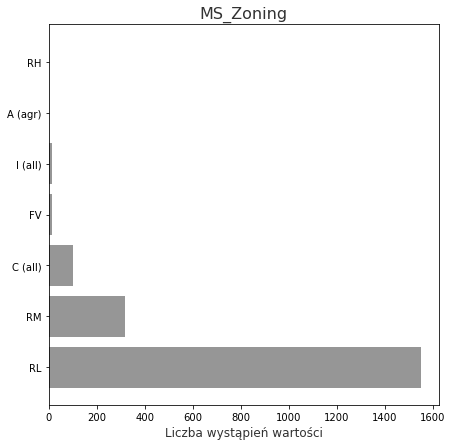

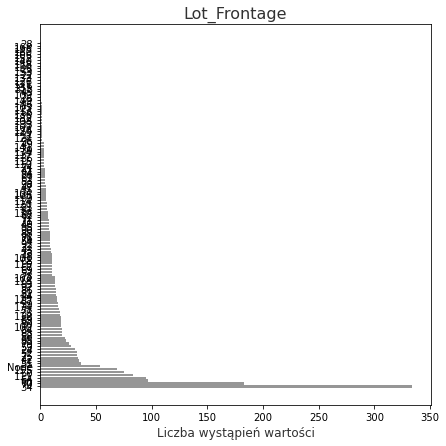

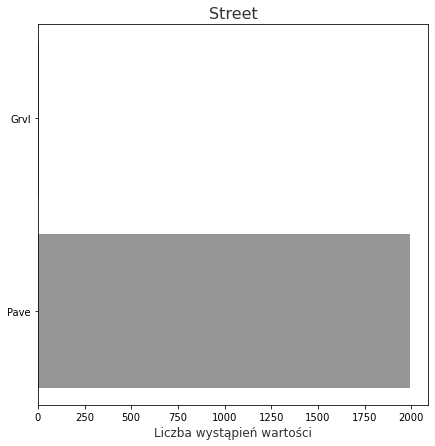

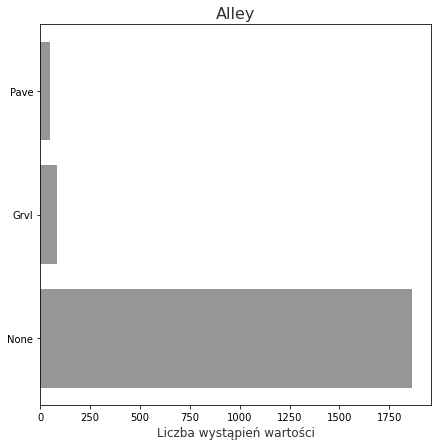

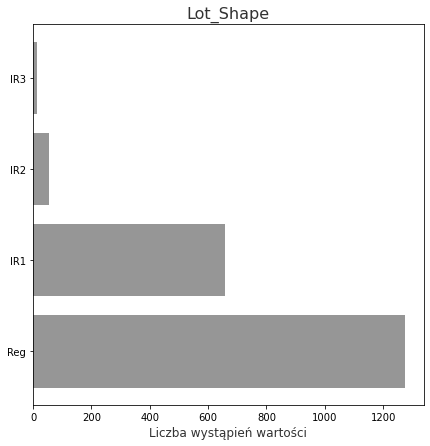

...

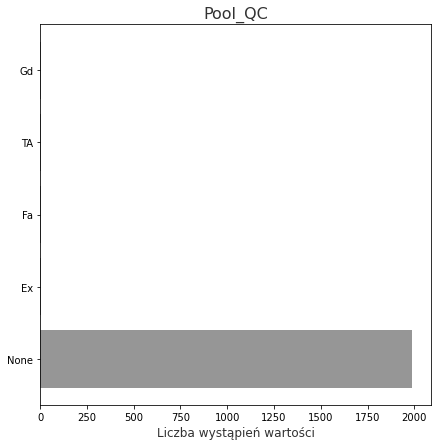

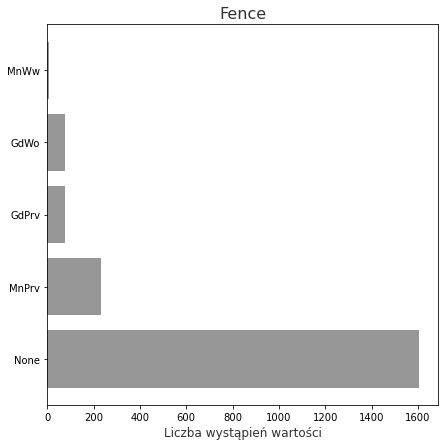

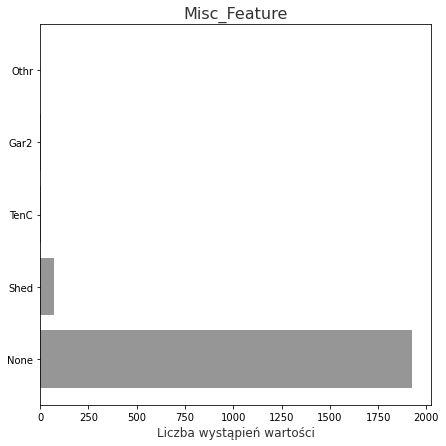

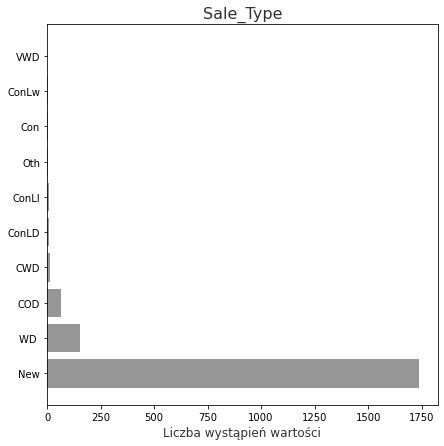

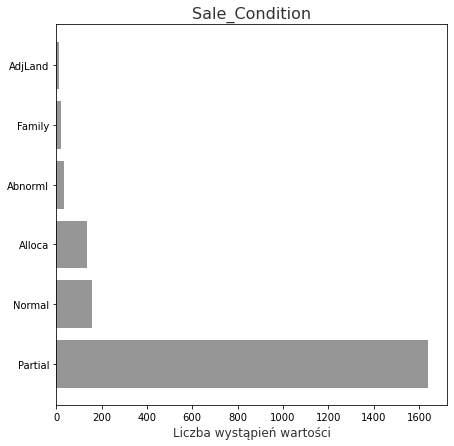

In [32]:
from sklearn.preprocessing import LabelEncoder
 
labelEncoder = LabelEncoder()
 
categorical_data = df.select_dtypes(include=['object']).columns
print(categorical_data)
for col in categorical_data:
    bars = df[col].unique()
    y = df[col].value_counts()
    y_pos = np.arange(len(y))

    plt.figure(figsize=(7,7))

    plt.barh(y_pos, y,color = '#969696')
    plt.yticks(y_pos, bars)
    plt.xlabel('Liczba wystąpień wartości', fontsize=12, color='#323232')
    plt.title(col, fontsize=16, color='#323232')
    plt.show()
# df[col] = labelEncoder.fit_transform(df[col])

In [33]:
# kolumny z danymi kategorycznymi posiadającymi tylko dwie wartości czyli zmienne dychotomiczne - kodujemy jako 0 i 1
# kolumny z danymi kategorycznymi posiadającymi więcej kategorii > 2 koduję kolejnymi liczbami naturalnymi.


In [34]:
categorical_data = df.select_dtypes(include=['object']).columns

for col in categorical_data:
    if df[col].value_counts().shape[0]==1:
        print(df[col].value_counts())

AllPub    2000
Name: Utilities, dtype: int64


In [35]:
Utilities_mapping = {'AllPub': 1} 
df['Utilities'] = df['Utilities'].map(Utilities_mapping)

In [36]:
categorical_data = df.select_dtypes(include=['object']).columns

for col in categorical_data:
    if df[col].value_counts().shape[0]==2:
        print(df[col].value_counts())
        

Pave    1992
Grvl       8
Name: Street, dtype: int64
Y    1873
N     127
Name: Central_Air, dtype: int64


In [37]:
Street_mapping = {'Pave': 1, 'Grvl': 0}
df['Street'] = df['Street'].map(Street_mapping)

In [38]:
print(df['Street'].value_counts())

1    1992
0       8
Name: Street, dtype: int64


In [39]:
Central_Air_mapping = {'Y': 1, 'N': 0}
df['Central_Air'] = df['Central_Air'].map(Central_Air_mapping)

In [40]:
print(df['Central_Air'].value_counts())

1    1873
0     127
Name: Central_Air, dtype: int64


In [41]:
categorical_data = df.select_dtypes(include=['object']).columns

for col in categorical_data:
    if df[col].value_counts().shape[0]==3:
        print(df[col].value_counts())

None    1865
Grvl      85
Pave      50
Name: Alley, dtype: int64
Gtl    1900
Mod      86
Sev      14
Name: Land_Slope, dtype: int64
Y    1809
N     145
P      46
Name: Paved_Drive, dtype: int64


In [42]:
Alley_mapping = {'None': 0, 'Grvl': 1,'Pave': 2}
df['Alley'] = df['Alley'].map(Alley_mapping)
print(df['Alley'].value_counts())

0    1865
1      85
2      50
Name: Alley, dtype: int64


In [43]:
Land_Slope_mapping = {'Sev': 0, 'Mod': 1, 'Gtl': 2}
df['Land_Slope'] = df['Land_Slope'].map(Land_Slope_mapping)
print(df['Land_Slope'].value_counts())

2    1900
1      86
0      14
Name: Land_Slope, dtype: int64


In [44]:
Paved_Drive_mapping = {'N': 0, 'P': 1, 'Y': 2}
df['Paved_Drive'] = df['Paved_Drive'].map(Paved_Drive_mapping)
print(df['Paved_Drive'].value_counts())

2    1809
0     145
1      46
Name: Paved_Drive, dtype: int64


In [45]:
categorical_data = df.select_dtypes(include=['object']).columns

for col in categorical_data:
    if df[col].value_counts().shape[0]==4:
        print(df[col].value_counts())

Reg    1275
IR1     657
IR2      55
IR3      13
Name: Lot_Shape, dtype: int64
Lvl    1809
Bnk      75
HLS      74
Low      42
Name: Land_Contour, dtype: int64
TA    1230
Gd     683
Ex      66
Fa      21
Name: Exter_Qual, dtype: int64
TA    1734
Gd     218
Fa      40
Ex       8
Name: Exter_Cond, dtype: int64
SBrkr    1837
FuseA     122
FuseF      37
FuseP       4
Name: Electrical, dtype: int64
0       1870
1        125
2          4
None       1
Name: Bsmt_Half_Bath, dtype: int64
TA    1025
Gd     785
Ex     140
Fa      50
Name: Kitchen_Qual, dtype: int64
Unf     831
RFn     578
Fin     479
None    112
Name: Garage_Finish, dtype: int64


In [46]:
df['Lot_Shape'].replace({'IR3':0,'IR2':1, 'IR1':2,'Reg':3},inplace=True)
df['Land_Contour'].replace({'Low':0,'HLS':1, 'Bnk':2,'Lvl':3},inplace=True)
df['Exter_Qual'].replace({'Fa':0,'TA':1, 'Gd':2,'Ex':3}, inplace=True)
df['Exter_Cond'].replace({'Fa':0,'TA':1, 'Gd':2,'Ex':3}, inplace=True)
df['Electrical'].replace({'FuseP':0,'FuseF':1, 'FuseA':2,'SBrkr':3}, inplace=True)
df['Bsmt_Half_Bath'].replace({'0':0,'1':1, '2':2,'None':0}, inplace=True)
df['Kitchen_Qual'].replace({'Fa':0,'TA':1, 'Gd':2,'Ex':3}, inplace=True)
df['Garage_Finish'].replace({'None':0,'Unf':1, 'RFn':2,'Fin':3}, inplace=True)



In [47]:
categorical_data = df.select_dtypes(include=['object']).columns

for col in categorical_data:
    if df[col].value_counts().shape[0]==5:
        print(df[col].value_counts())

Inside     1452
Corner      344
CulDSac     129
FR2          61
FR3          14
Name: Lot_Config, dtype: int64
1Fam      1665
TwnhsE     150
Duplex      80
Twnhs       61
2fmCon      44
Name: Bldg_Type, dtype: int64
None       1232
BrkFace     593
Stone       159
BrkCmn       15
CBlock        1
Name: Mas_Vnr_Type, dtype: int64
No      1306
Av       285
Gd       188
Mn       166
None      55
Name: Bsmt_Exposure, dtype: int64
Ex    1012
TA     613
Gd     313
Fa      61
Po       1
Name: Heating_QC, dtype: int64
0       1154
1        818
2         26
3          1
None       1
Name: Bsmt_Full_Bath, dtype: int64
None    1989
Gd         4
Ex         3
TA         2
Fa         2
Name: Pool_QC, dtype: int64
None     1605
MnPrv     232
GdPrv      78
GdWo       78
MnWw        7
Name: Fence, dtype: int64
None    1926
Shed      69
Othr       2
Gar2       2
TenC       1
Name: Misc_Feature, dtype: int64


In [48]:
df['Bsmt_Exposure'].replace({'None':0,'No':1, 'Mn':2,'Av':3,'Gd':4}, inplace=True)
df['Heating_QC'].replace({'Po':0,'Fa':1,'TA':2, 'Gd':3,'Ex':4}, inplace=True)
df['Bsmt_Full_Bath'].replace({'None':0,'0':0,'1':1, '2':2,'3':3}, inplace=True)
df['Pool_QC'].replace({'None':0,'Fa':1, 'TA':2,'Gd':3,'Ex':4}, inplace=True)
df['Fence'].replace({'None':0,'MnWw':1, 'GdWo':2,'MnPrv':3,'GdPrv':4}, inplace=True)

#Dla poniższych kolumn trudno ustalić skalę, dlatego zastosuję hot one encoding 
# Lot_Config
# Bldg_Type
# Mas_Vnr_Type
# Misc_Feature

In [49]:
categorical_data = df.select_dtypes(include=['object']).columns

for col in categorical_data:
    if df[col].value_counts().shape[0]>5:
        print(df[col].value_counts())

RL         1549
RM          317
FV          103
RH           16
C (all)      13
A (agr)       1
I (all)       1
Name: MS_Zoning, dtype: int64
None    334
60      183
80       97
70       95
50       83
       ... 
126       1
168       1
153       1
111       1
152       1
Name: Lot_Frontage, Length: 121, dtype: int64
Nonemes    303
CollgCr    192
OldTown    166
Somerst    134
Edwards    134
Sawyer     107
NridgHt    104
Gilbert     99
NWAmes      92
SawyerW     80
BrkSide     78
Crawfor     73
Mitchel     72
IDOTRR      62
NoRidge     56
Timber      48
StoneBr     38
ClearCr     33
SWISU       31
MeadowV     28
Veenker     15
NPkVill     14
Blmngtn     14
BrDale      13
Blueste      8
Greens       5
GrnHill      1
Name: Neighborhood, dtype: int64
Norm      1721
Feedr      113
Artery      61
RRAn        33
PosN        25
RRAe        20
PosA        14
RRNn         8
RRNe         5
Name: Condition_1, dtype: int64
Norm      1981
Feedr        9
Artery       3
PosN         3
RRNn         2


In [50]:
df['Bsmt_Qual'].replace({'None':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5}, inplace=True)
df['Bsmt_Cond'].replace({'None':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5}, inplace=True)
df['Fireplace_Qu'].replace({'None':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5}, inplace=True)
df['Garage_Cars'].replace({'None':0,'0':0,'1':1,'2':2,'3':3,'4':4, '5':5}, inplace=True)
df['Garage_Qual'].replace({'None':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5}, inplace=True)
df['Garage_Cond'].replace({'None':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5}, inplace=True)

# Dla poniższych kolumn trudno ustalić skalę, dlatego zastosuję hot one encoding 
# Lot_Config
# Bldg_Type
# Mas_Vnr_Type
# Misc_Feature
# MS_Zoning
# Neighborhood
# Condition_1
# Condition_2
# House_Style
# Roof_Style
# Roof_Matl
# Exterior_1st
# Exterior_2nd
# Foundation
# BsmtFin_Type_1
# BsmtFin_Type_2
# Total_Bsmt_SF
# Heating
# Functional
# Garage_Type
# Sale_Type
# Sale_Condition

# Niektóre kolumny zawierają większość danych numerycznych:
# Lot_Frontage
# Mas_Vnr_Area
# BsmtFin_SF_1
# BsmtFin_SF_2
# Bsmt_Unf_SF
# Total_Bsmt_SF
# Garage_Yr_Blt
# Garage_Area

# więc koszykuje wartości z kolumn posiadających wartości liczbowe ciągłe

In [51]:
def transformContinous(name):
    df.loc[df[name] == 'None', name] = 0
    df[name] = df[name].astype(int)
    fig, ax = plt.subplots()
    ax.scatter(x = df[name], y = df['SalePrice'])
    plt.ylabel('SalePrice', fontsize=13)
    plt.xlabel(name, fontsize=13)
    plt.show()

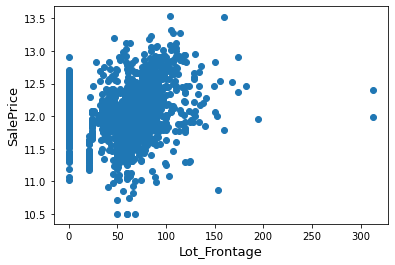

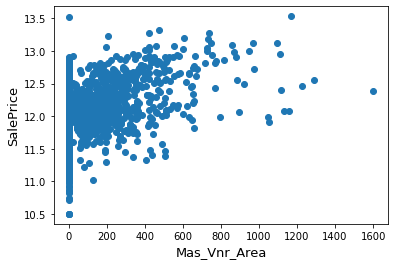

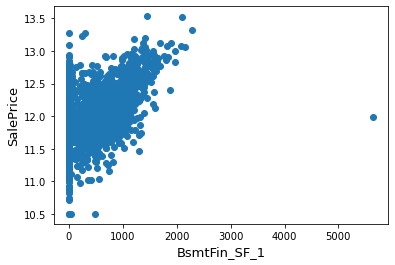

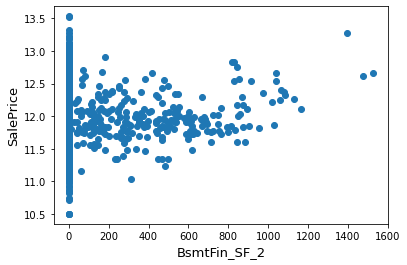

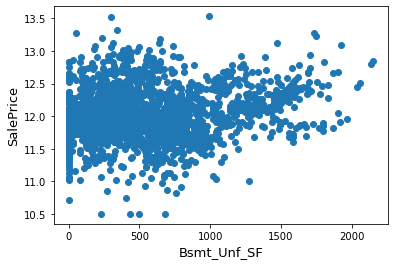

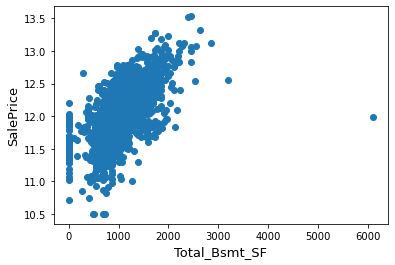

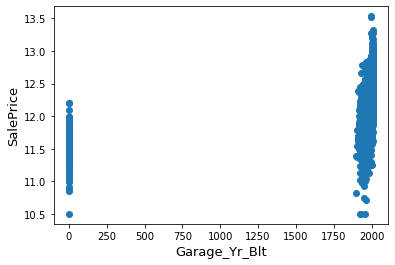

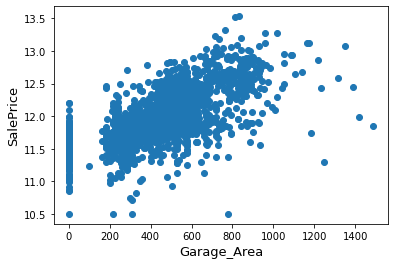

In [52]:
transformContinous('Lot_Frontage')
transformContinous('Mas_Vnr_Area')
transformContinous('BsmtFin_SF_1')
transformContinous('BsmtFin_SF_2')
transformContinous('Bsmt_Unf_SF')
transformContinous('Total_Bsmt_SF')
transformContinous('Garage_Yr_Blt')
transformContinous('Garage_Area')

In [53]:
# widocznych jest niewiele wartości odstających. Koryguję:

In [54]:
df.loc[df['Lot_Frontage'] > 200, 'Lot_Frontage'] = 200
df.loc[df['BsmtFin_SF_1'] > 3000, 'BsmtFin_SF_1'] = 2500
df.loc[df['BsmtFin_SF_2'] > 1300, 'BsmtFin_SF_2'] = 1300
df.loc[df['Total_Bsmt_SF'] > 3500, 'Total_Bsmt_SF'] = 3500

In [55]:
# poprawiamy wartości None przekształcone na 0 dla kolumny 'Rok budowy garażu'
Garage_Yr_Blt_mean = df[df['Garage_Yr_Blt'] != 0]
df.loc[df['Garage_Yr_Blt'] ==0, 'Garage_Yr_Blt'] = int(Garage_Yr_Blt_mean['Garage_Yr_Blt'].mean())

In [56]:
# Dla poniższych kolumn trudno ustalić skalę, dlatego zastosuję hot one encoding 
# Lot_Config
# Bldg_Type
# Mas_Vnr_Type
# Misc_Feature
# MS_Zoning
# Neighborhood
# Condition_1
# Condition_2
# House_Style
# Roof_Style
# Roof_Matl
# Exterior_1st
# Exterior_2nd
# Foundation
# BsmtFin_Type_1
# BsmtFin_Type_2
# Total_Bsmt_SF
# Heating
# Functional
# Garage_Type
# Sale_Type
# Sale_Condition

In [57]:
df.head()

,MS_SubClass,MS_Zoning,Lot_Frontage,Lot_Area,Street,Alley,Lot_Shape,Land_Contour,Utilities,Lot_Config,...,Pool_Area,Pool_QC,Fence,Misc_Feature,Misc_Val,Mo_Sold,Yr_Sold,Sale_Type,Sale_Condition,SalePrice
0,120,RL,34,3901,1,0,3,3,1,Inside,...,0,0,0,None,0,8,2007,New,Partial,12.225875
1,20,RL,70,8400,1,0,3,3,1,Corner,...,0,0,3,None,0,4,2010,WD,Normal,11.744037
2,85,RL,60,7200,1,0,3,3,1,Inside,...,0,0,3,None,0,4,2009,WD,Normal,11.804849
3,90,RL,64,7018,1,0,3,2,1,Inside,...,0,0,0,None,0,6,2009,WD,Alloca,11.685685
4,60,RL,111,16259,1,0,3,3,1,Corner,...,0,0,0,None,0,9,2006,New,Partial,12.744444


In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 80 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MS_SubClass      2000 non-null   int64  
 1   MS_Zoning        2000 non-null   object 
 2   Lot_Frontage     2000 non-null   int32  
 3   Lot_Area         2000 non-null   int64  
 4   Street           2000 non-null   int64  
 5   Alley            2000 non-null   int64  
 6   Lot_Shape        2000 non-null   int64  
 7   Land_Contour     2000 non-null   int64  
 8   Utilities        2000 non-null   int64  
 9   Lot_Config       2000 non-null   object 
 10  Land_Slope       2000 non-null   int64  
 11  Neighborhood     2000 non-null   object 
 12  Condition_1      2000 non-null   object 
 13  Condition_2      2000 non-null   object 
 14  Bldg_Type        2000 non-null   object 
 15  House_Style      2000 non-null   object 
 16  Overall_Qual     2000 non-null   int64  
 17  Overall_Cond  

In [59]:

nominal_categorical_data = df[['Lot_Config', 'Bldg_Type','Mas_Vnr_Type', 'Misc_Feature', 'MS_Zoning', 'Neighborhood', 'Condition_1', 'Condition_2', 'House_Style', 'Roof_Style', 'Roof_Matl', 'Exterior_1st', 'Exterior_2nd', 'Foundation', 'BsmtFin_Type_1', 'BsmtFin_Type_2', 'Total_Bsmt_SF', 'Heating', 'Functional', 'Garage_Type', 'Sale_Type', 'Sale_Condition']]

In [60]:

for column in nominal_categorical_data:
    a = df[[column]].copy()
    df = df.drop(column, axis=1)
    a = pd.get_dummies(a)
    df = pd.concat([df, a], axis=1)

In [61]:
df.head()

,MS_SubClass,Lot_Frontage,Lot_Area,Street,Alley,Lot_Shape,Land_Contour,Utilities,Land_Slope,Overall_Qual,...,Sale_Type_New,Sale_Type_Oth,Sale_Type_VWD,Sale_Type_WD,Sale_Condition_Abnorml,Sale_Condition_AdjLand,Sale_Condition_Alloca,Sale_Condition_Family,Sale_Condition_Normal,Sale_Condition_Partial
0,120,34,3901,1,0,3,3,1,2,6,...,1,0,0,0,0,0,0,0,0,1
1,20,70,8400,1,0,3,3,1,2,4,...,0,0,0,1,0,0,0,0,1,0
2,85,60,7200,1,0,3,3,1,2,5,...,0,0,0,1,0,0,0,0,1,0
3,90,64,7018,1,0,3,2,1,2,5,...,0,0,0,1,0,0,1,0,0,0
4,60,111,16259,1,0,3,3,1,2,9,...,1,0,0,0,0,0,0,0,0,1


In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Columns: 236 entries, MS_SubClass to Sale_Condition_Partial
dtypes: float64(1), int32(8), int64(50), uint8(177)
memory usage: 1.2 MB


In [63]:
categorical_data = df.select_dtypes(include=['object']).columns

for col in categorical_data:
        print(df[col].value_counts())

## Modelowanie

In [64]:
# Dodaję biblioteki

In [104]:
import math
from sklearn.model_selection import train_test_split
from sklearn import model_selection
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV, KFold 
from sklearn.preprocessing import PolynomialFeatures
import xgboost as xgb
from sklearn.svm import SVR, SVC
from sklearn.ensemble import RandomForestRegressor
from sklearn import  metrics
from sklearn.linear_model import Lasso,LassoCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn import linear_model

In [66]:
correl = df.corr()
correl.sort_values(['SalePrice'], ascending=False, inplace=True)
correl.SalePrice

SalePrice             1.000000
Overall_Qual          0.833923
Gr_Liv_Area           0.719268
Exter_Qual            0.681329
Garage_Cars           0.672844
                        ...   
Foundation_CBlock    -0.337620
MS_Zoning_RM         -0.359757
Garage_Type_Detchd   -0.402728
Mas_Vnr_Type_None    -0.424219
Utilities                  NaN
Name: SalePrice, Length: 236, dtype: float64

In [67]:
# Oddzielam zmienną którą będę przewidywać (Sale Price) od danych 

In [68]:
y_df = df['SalePrice']
x_df = df.drop(['SalePrice'], axis=1)

In [69]:
print(x_df.shape)
print(y_df.shape)

(2000, 235)
(2000,)


In [70]:
y_df.head(10)

0    12.225875
1    11.744037
2    11.804849
3    11.685685
4    12.744444
5    11.393579
6    12.538967
7    11.561716
8    12.367341
9    11.444315
Name: SalePrice, dtype: float64

In [71]:
# Rozdzielam zbiór danych x_df na zbiór testowy i treningowy

In [72]:
X_train, X_test, y_train, y_test = train_test_split(x_df, y_df, test_size=0.3, random_state=10)

In [73]:
X_train.info()
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1400 entries, 1443 to 1289
Columns: 235 entries, MS_SubClass to Sale_Condition_Partial
dtypes: int32(8), int64(50), uint8(177)
memory usage: 843.6 KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 600 entries, 115 to 1590
Columns: 235 entries, MS_SubClass to Sale_Condition_Partial
dtypes: int32(8), int64(50), uint8(177)
memory usage: 361.5 KB


In [74]:
# skalowanie

In [75]:
scaler = StandardScaler()

scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [76]:
pca = PCA(n_components = 10)

pca.fit(X_train)
X_train = pca.transform(X_train)
X_test = pca.transform(X_test)

# Testuję modele
## Regresja liniowa

In [77]:
pipe = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())
kfold = model_selection.KFold(n_splits=5, random_state=40, shuffle=True)
linear_regr = GridSearchCV(pipe,
              param_grid={'polynomialfeatures__degree': [1, 2, 3]},
              cv=kfold,
              refit=True)

#fit grid search
linear_regr.fit(X_train, y_train)

#best estimator
print(linear_regr.best_params_)
print("Best score: %0.3f" % linear_regr.best_score_)
print(linear_regr.best_estimator_)


{'polynomialfeatures__degree': 2}
Best score: 0.855
Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('linearregression', LinearRegression())])


# Regresja Ridge

In [78]:
ridge_regr = GridSearchCV(make_pipeline(PolynomialFeatures(degree=2), linear_model.Ridge(alpha=1, tol=0.1)),
                    param_grid={'polynomialfeatures__degree': [1, 2, 3],
                    'ridge__alpha': [350, 400, 450]},
                    cv=5,
                    refit=True)
ridge_regr.fit(X_train, y_train)

print(ridge_regr.best_params_)
print("Best score: %0.3f" % ridge_regr.best_score_)
print(ridge_regr.best_estimator_)

{'polynomialfeatures__degree': 2, 'ridge__alpha': 350}
Best score: 0.859
Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('ridge', Ridge(alpha=350, tol=0.1))])


# Regresja Lasso

In [79]:
lasso_regr = GridSearchCV(make_pipeline(PolynomialFeatures(degree=2), Lasso(alpha=1, tol=0.1)),
                    param_grid={'polynomialfeatures__degree': [1, 2, 3],
                    'lasso__alpha': [0.1, 0.5, 0.7, 1]},
                    cv=5,
                    refit=True)
lasso_regr.fit(X_train, y_train)

print(lasso_regr.best_params_)
print("Best score: %0.3f" % lasso_regr.best_score_)
print(lasso_regr.best_estimator_)

{'lasso__alpha': 0.1, 'polynomialfeatures__degree': 2}
Best score: 0.795
Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('lasso', Lasso(alpha=0.1, tol=0.1))])


# Random Forest

In [80]:
rand_forest = GridSearchCV(RandomForestRegressor(n_jobs = -1, max_features = 'sqrt', n_estimators = 50, oob_score = True),
              param_grid={
                   'n_estimators': [10, 20, 50, 150, 200],
                    'max_features': ['auto', 'sqrt', 'log2'],  
                    'max_depth': [10, 100, 200]
                   },
              cv=5,
              refit=True)
rand_forest.fit(X_train, y_train)

print(rand_forest.best_params_)
print("Best score: %0.3f" % rand_forest.best_score_)
print(rand_forest.best_estimator_)

{'max_depth': 100, 'max_features': 'auto', 'n_estimators': 200}
Best score: 0.861
RandomForestRegressor(max_depth=100, n_estimators=200, n_jobs=-1,
                      oob_score=True)


In [81]:
#podsumowanie wyników dla badanych modeli:

In [82]:
model_list = []
model_list.append(('Linear_Regression', linear_regr.best_estimator_))
model_list.append(('Ridge_Regression', ridge_regr.best_estimator_))
model_list.append(('Lasso_Regression', lasso_regr.best_estimator_))
model_list.append(('Random_Forest', rand_forest.best_estimator_))


#zbiór treningowy
r2_train_list = []
explained_variance_score_train_list = []
mean_squared_error_train_list= []
mean_absolute_error_train_list = []

#zbiór testowy
r2_test_list = []
explained_variance_score_test_list = []
mean_squared_error_test_list = []
mean_absolute_error_test_list = []

for name, model in model_list:

        r2_train = metrics.r2_score(y_train, model.predict(X_train))
        explained_variance_score_train = metrics.explained_variance_score(y_train, model.predict(X_train))
        MSE_train= metrics.mean_squared_error(y_train, model.predict(X_train))
        MAE_train = metrics.mean_absolute_error(y_train, model.predict(X_train))
        r2_test = metrics.r2_score(y_test, model.predict(X_test))
        explained_variance_score_test = metrics.explained_variance_score(y_test, model.predict(X_test))
        MSE_test = metrics.mean_squared_error(y_test, model.predict(X_test))
        MAE_test = metrics.mean_absolute_error(y_test, model.predict(X_test))
        
        r2_train_list.append(r2_train)
        explained_variance_score_train_list.append(explained_variance_score_train)
        mean_squared_error_train_list.append(MSE_train)
        mean_absolute_error_train_list.append(MAE_train)
        r2_test_list.append(r2_test)
        explained_variance_score_test_list.append(explained_variance_score_test)
        mean_squared_error_test_list.append(MSE_test)
        mean_absolute_error_test_list.append(MAE_test)

        print(name)
        print("")
        print("R^2_train: {}".format(r2_train))
        print("Expl variance score train: {}".format(explained_variance_score_train))
        print("MSE_train: {}".format(MSE_train))
        print("MAE_train: {}".format(MAE_train))
        print("")
        print("R^2_test: {}".format(r2_test))
        print("Expl variance score test: {}".format(explained_variance_score_test))
        print("MSE_test: {}".format(MSE_test))
        print("MAE_test: {}".format(MAE_test))
        print("")
        
  

Linear_Regression

R^2_train: 0.8977231907563168
Expl variance score train: 0.8977231907563168
MSE_train: 0.01600794649397953
MAE_train: 0.0915598218891365

R^2_test: 0.890528240768016
Expl variance score test: 0.8905682726870812
MSE_test: 0.017685637101715446
MAE_test: 0.09994344913661891

Ridge_Regression

R^2_train: 0.895692521543651
Expl variance score train: 0.895692521543651
MSE_train: 0.016325778506375184
MAE_train: 0.0917939331602769

R^2_test: 0.8888253372411288
Expl variance score test: 0.8888856083552467
MSE_test: 0.017960748546046366
MAE_test: 0.10094447989618079

Lasso_Regression

R^2_train: 0.812298839994938
Expl variance score train: 0.812298839994938
MSE_train: 0.029378215339705655
MAE_train: 0.1222214151393815

R^2_test: 0.795966322858424
Expl variance score test: 0.7959748047851868
MSE_test: 0.03296252472573961
MAE_test: 0.13282069098475907

Random_Forest

R^2_train: 0.9821206100418683
Expl variance score train: 0.9821300640310192
MSE_train: 0.002798408748877188
MAE_t

In [83]:
DATA = {'R2 train': r2_train_list, 'R2 test': r2_test_list, 
     'Expl variance score train': explained_variance_score_train_list,'Expl variance score test': explained_variance_score_test_list, 
     'MSE train': mean_squared_error_train_list,'MSE test': mean_squared_error_test_list,
     'MAE train' : mean_absolute_error_train_list,'MAE test' : mean_absolute_error_test_list,
    }

summary_table = pd.DataFrame(data=DATA)
summary_table.insert(loc=0, column='Method', value=['Linear_Regression','Ridge_Regression','Lasso_Regression', 'Random_Forest'])
summary_table

,Method,R2 train,R2 test,Expl variance score train,Expl variance score test,MSE train,MSE test,MAE train,MAE test
0,Linear_Regression,0.897723,0.890528,0.897723,0.890568,0.016008,0.017686,0.091560,0.099943
1,Ridge_Regression,0.895693,0.888825,0.895693,0.888886,0.016326,0.017961,0.091794,0.100944
2,Lasso_Regression,0.812299,0.795966,0.812299,0.795975,0.029378,0.032963,0.122221,0.132821
3,Random_Forest,0.982121,0.867851,0.982130,0.867875,0.002798,0.021349,0.036967,0.105747


# Podsumowanie wyników

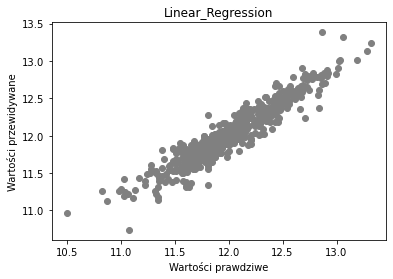

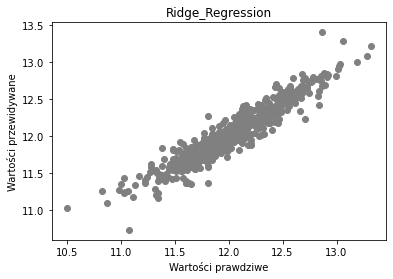

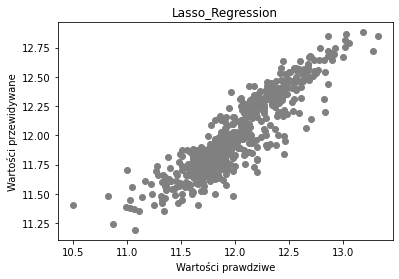

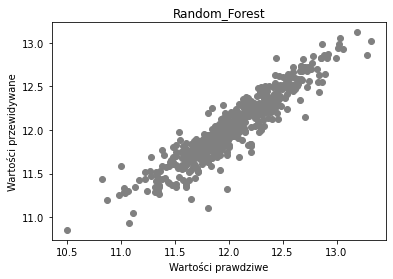

In [96]:
y_pred_list = []
y_pred_list.append(('Linear_Regression', linear_regr.best_estimator_.predict(X_test)))
y_pred_list.append(('Ridge_Regression', ridge_regr.best_estimator_.predict(X_test)))
y_pred_list.append(('Lasso_Regression', lasso_regr.best_estimator_.predict(X_test)))
y_pred_list.append(('Random_Forest', rand_forest.best_estimator_.predict(X_test)))


for name, y_pred in y_pred_list:
    
    plt.scatter(y_test, y_pred, color='gray')
    plt.title(name)
    plt.xlabel('Wartości prawdziwe')
    plt.ylabel('Wartości przewidywane')
    plt.show()



In [ ]:
# pamiętamy jednak że wcześniej dokonaliśmy logarytmowania ceny.
# Teraz dokonamy operacji odwrotnej.

Linear_Regression


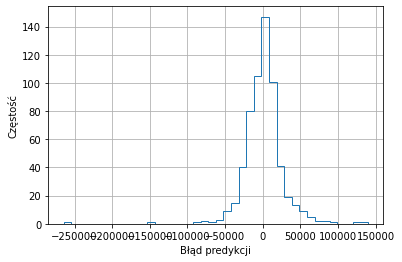

Ridge_Regression


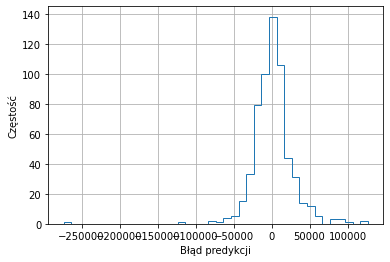

Lasso_Regression


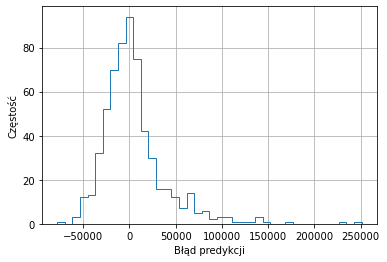

Random_Forest


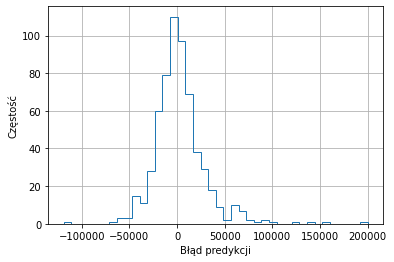

In [105]:
y_real = math.e**y_test

y_pred_list = []
y_pred_list.append(('Linear_Regression', linear_regr.best_estimator_.predict(X_test)))
y_pred_list.append(('Ridge_Regression', ridge_regr.best_estimator_.predict(X_test)))
y_pred_list.append(('Lasso_Regression', lasso_regr.best_estimator_.predict(X_test)))
y_pred_list.append(('Random_Forest', rand_forest.best_estimator_.predict(X_test)))

for name, y_pred in y_pred_list:
    print(name)
    y_pred_real = math.e**y_pred

    diff = y_real - y_pred_real
    diff.hist(bins = 40, histtype='step', stacked=True, fill=False)
    plt.ylabel('Częstość')
    plt.xlabel('Błąd predykcji')
    plt.show()
